# Draw global and regional maps

In [1]:
from pathlib import Path
import sys
import os
import shutil
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import gsw
from IPython.display import display,Image

from importlib import reload
import meop
import meop_metadata
import meop_plot_data
import meop_filenames

## Load metadata

In [2]:
## load metadata for public data
# rebuild: if True, rebuild the database of metadata from netcdf files
# public: keep only public profiles
# Tdata: keep only profiles with valid temperature data
lprofiles, ltags, ldeployments = meop_metadata.read_lists_metadata(rebuild=False,public=True,Tdata=True)

# Regional maps

## Map for a single deployment

(<Figure size 1500x1500 with 1 Axes>, <GeoAxesSubplot:>)

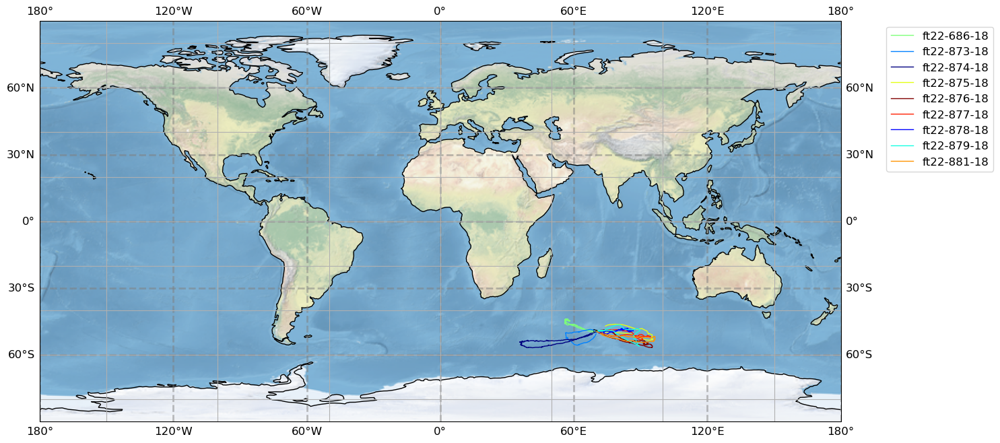

In [3]:
meop_plot_data.plot_map_deployments(lprofiles[lprofiles.DEPLOYMENT_CODE=='ft22'])

## Map for a subset of tags based on location and year

(<Figure size 1080x1080 with 1 Axes>,
 <cartopy.mpl.geoaxes.GeoAxesSubplot at 0x7f0c5d52eed0>)

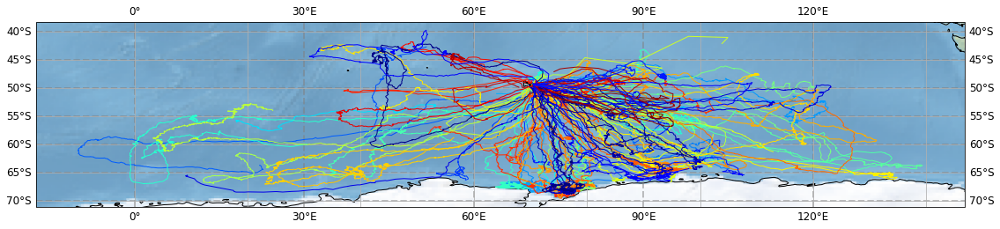

In [4]:
# select tags with at least one profiles satisfying a given criterion
def select_tags(lprofiles,select):
    df = lprofiles[select]
    lprofiles = lprofiles[lprofiles.SMRU_PLATFORM_CODE.isin(df.SMRU_PLATFORM_CODE)]
    return lprofiles

select = (lprofiles.year.isin([2018,2019])) & (lprofiles.LONGITUDE>0) & (lprofiles.LONGITUDE<125) & (lprofiles.LATITUDE<0)
meop_plot_data.plot_map_deployments(select_tags(lprofiles,select),legend=False)

## Map tracks for tags with full resolution available only

(<Figure size 1080x1080 with 1 Axes>,
 <cartopy.mpl.geoaxes.GeoAxesSubplot at 0x7f0c5ab65710>)

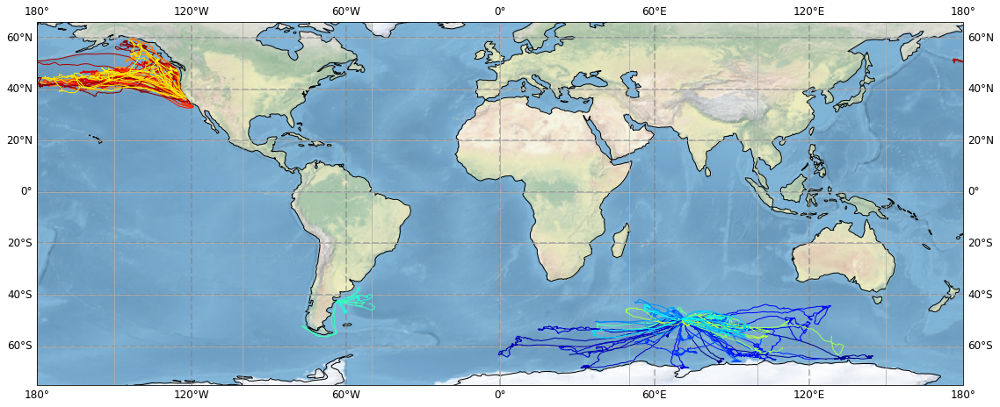

In [5]:
lprof_fr1, ltags_fr1, ldepl_fr1 = meop_metadata.read_lists_metadata(public=True,Tdata=True,qf='fr1')
meop_plot_data.plot_map_deployments(lprof_fr1,legend=False)

# Global maps

(<Figure size 1080x1080 with 1 Axes>,
 <cartopy.mpl.geoaxes.GeoAxesSubplot at 0x7f0c5ce02c90>)

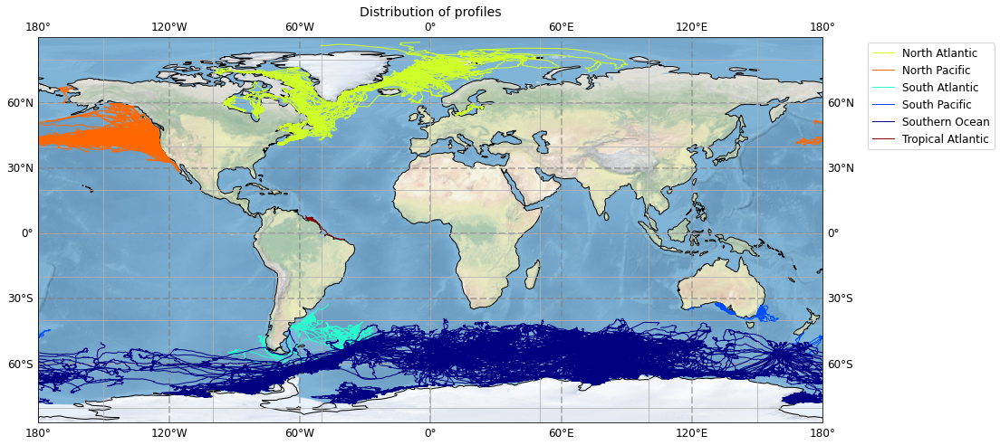

In [6]:
meop_plot_data.plot_map_deployments(lprofiles,
                          groupby='MASK',
                          title=f'Distribution of profiles',
                          legend=True,
                          namefig='Global_distribution_by_regions.png',
                          folder=meop_filenames.processdir,
                         )

(<Figure size 1080x1080 with 1 Axes>,
 <cartopy.mpl.geoaxes.GeoAxesSubplot at 0x7f0c5ab89550>)

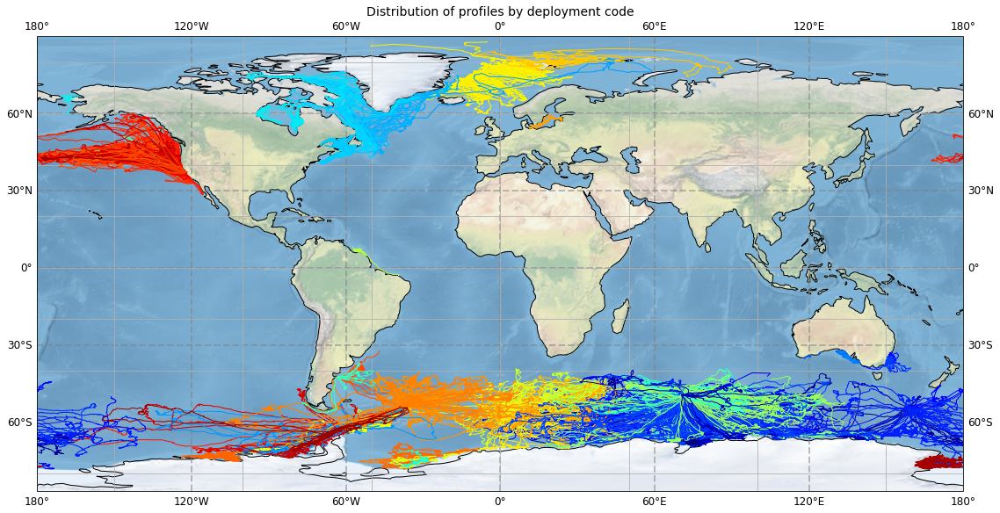

In [7]:
meop_plot_data.plot_map_deployments(lprofiles,
                          groupby='DEPLOYMENT_CODE',
                          title=f'Distribution of profiles by deployment code',
                          legend=False,
                          namefig='Global_distribution_by_deployment.png',
                          folder=meop_filenames.processdir,
                         )

(<Figure size 1080x1080 with 1 Axes>,
 <cartopy.mpl.geoaxes.GeoAxesSubplot at 0x7f0c55ee0950>)

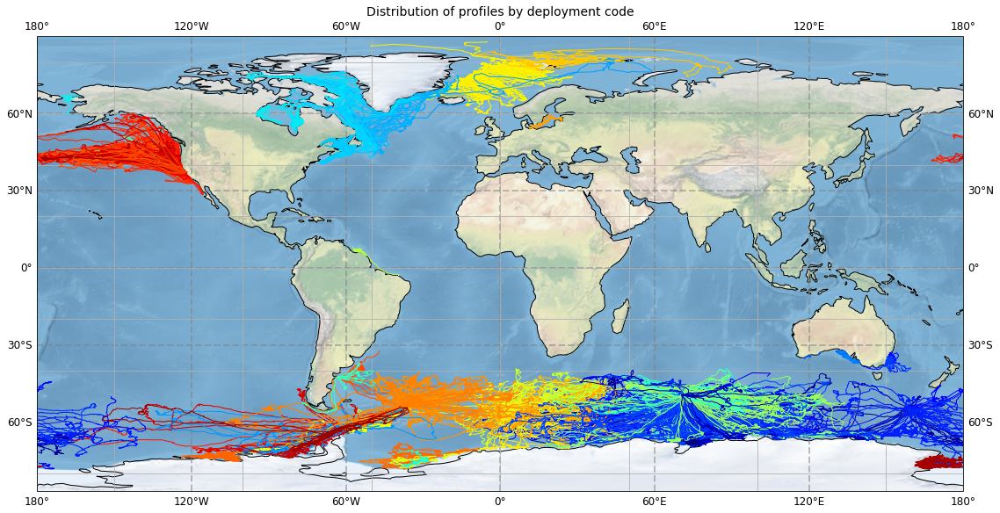

In [8]:
reload(meop_plot_data)
meop_plot_data.plot_map_deployments(lprofiles,
                          groupby='DEPLOYMENT_CODE',
                          title=f'Distribution of profiles by deployment code',
                          legend=False,
                          legend_horiz=True,
                          namefig='Global_distribution_by_deployment_with_legend.png',
                          folder=meop_filenames.processdir,
                         )

(<Figure size 1080x1080 with 1 Axes>,
 <cartopy.mpl.geoaxes.GeoAxesSubplot at 0x7f0c53d16210>)

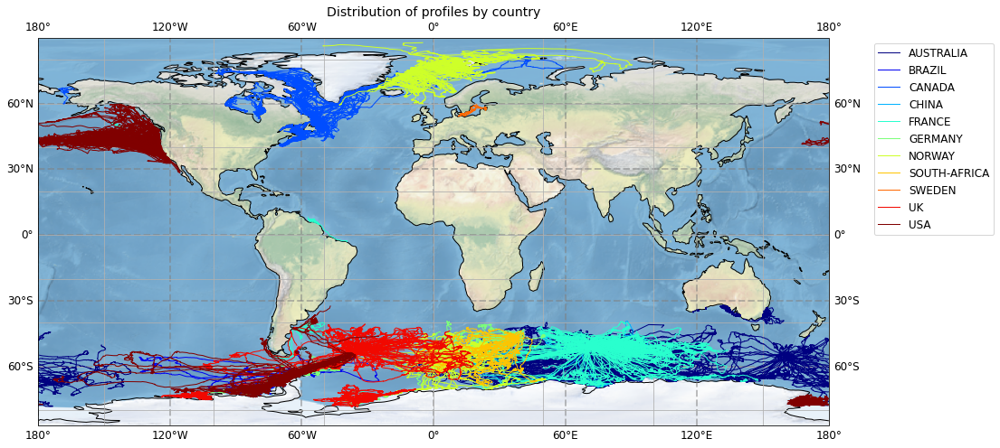

In [9]:
if 'COUNTRY' not in lprofiles:
    lprofiles = lprofiles.merge(ldeployments[['DEPLOYMENT_CODE','COUNTRY']],on='DEPLOYMENT_CODE',right_index=False,)
meop_plot_data.plot_map_deployments(lprofiles,
                          groupby='COUNTRY',
                          title=f'Distribution of profiles by country',
                          legend=True,
                          namefig='Global_distribution_by_country.png',
                          folder=meop_filenames.processdir,
                         )

# Maps by region

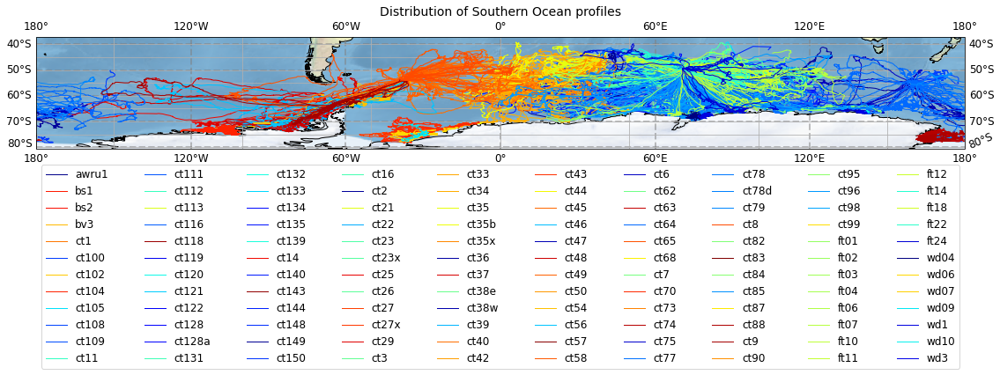

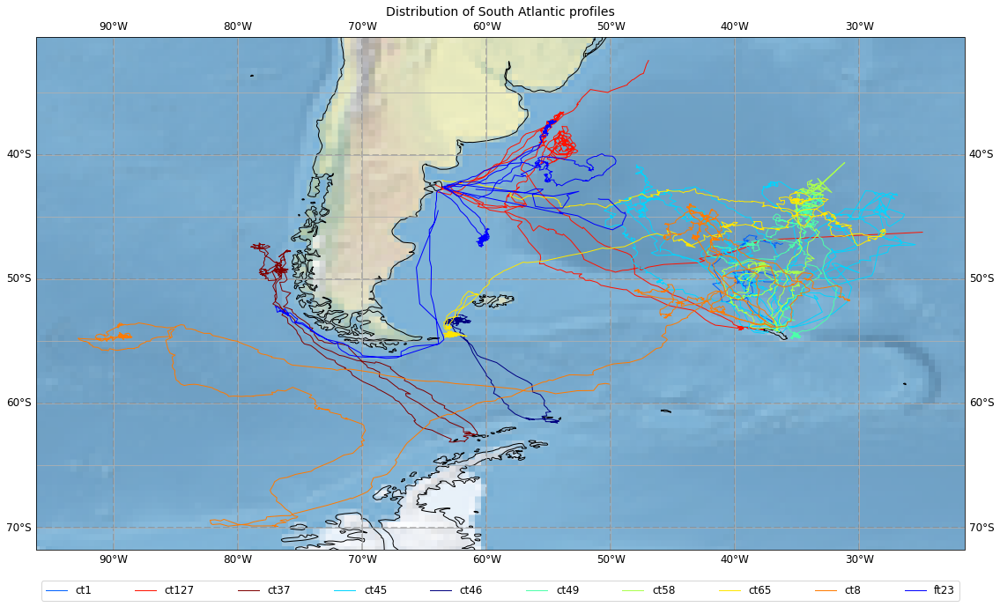

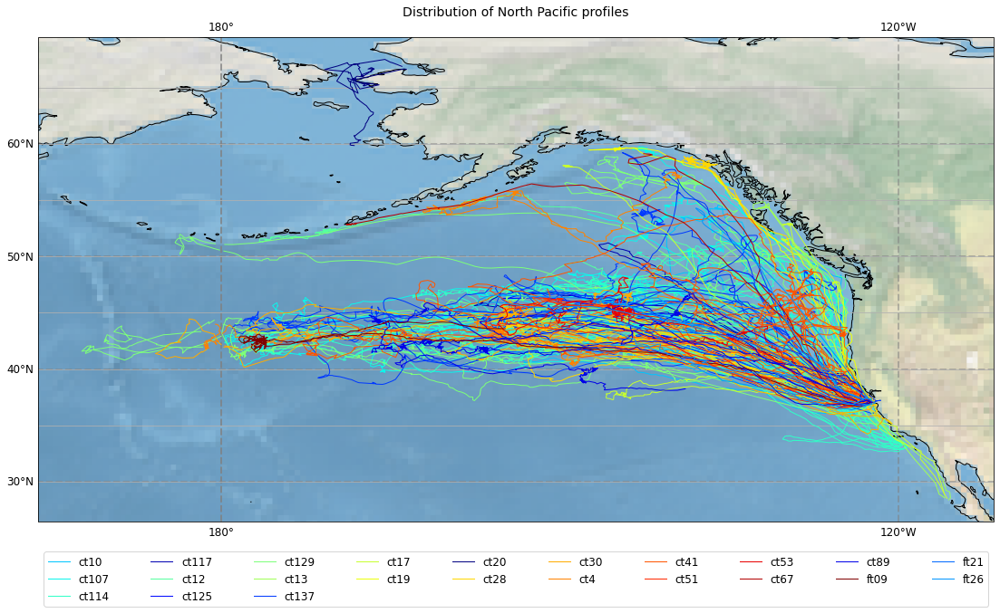

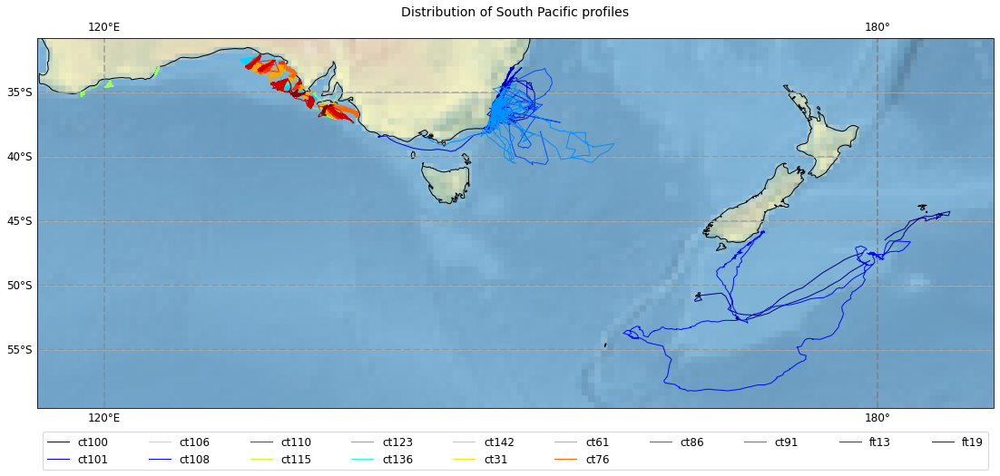

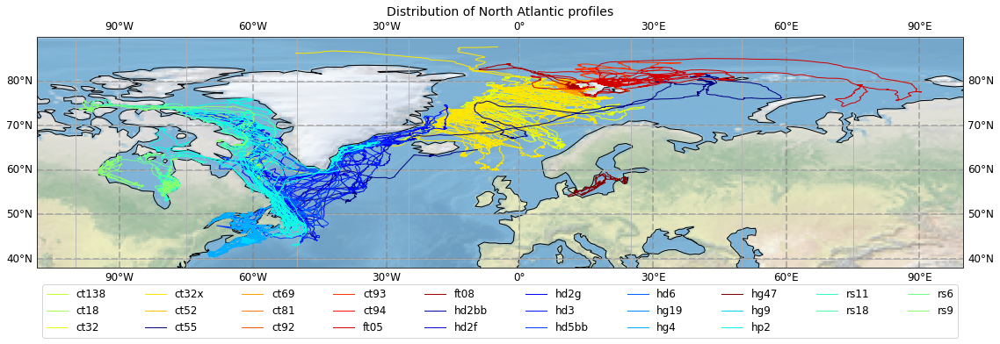

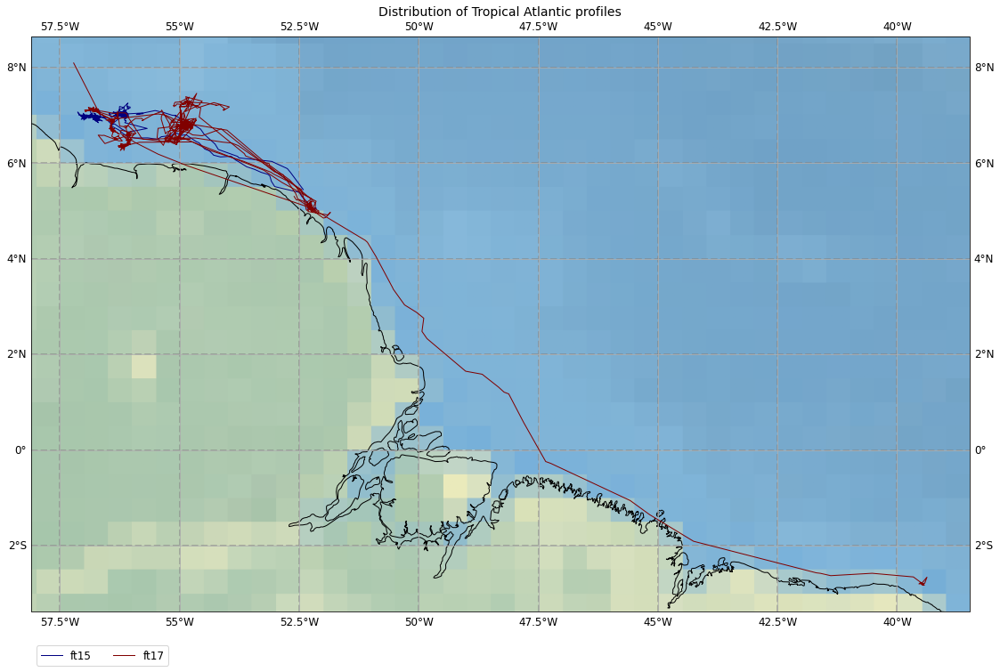

In [11]:
reload(meop_plot_data)
for region in ltags.MASK.unique():
    index_tags = ltags[ltags.MASK==region].SMRU_PLATFORM_CODE
    meop_plot_data.plot_map_deployments(lprofiles[lprofiles.SMRU_PLATFORM_CODE.isin(index_tags)],
                              groupby='DEPLOYMENT_CODE',
                              title=f'Distribution of {region} profiles',
                              legend=True,
                              legend_horiz=True,
                              namefig=f'Regional_distribution_{region}.png',
                              folder=meop_filenames.processdir,
                             )

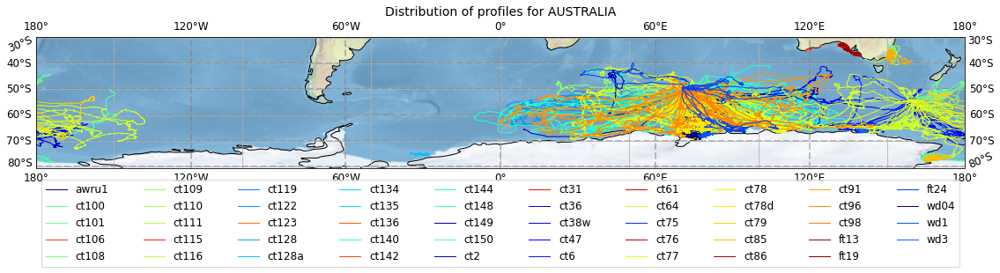

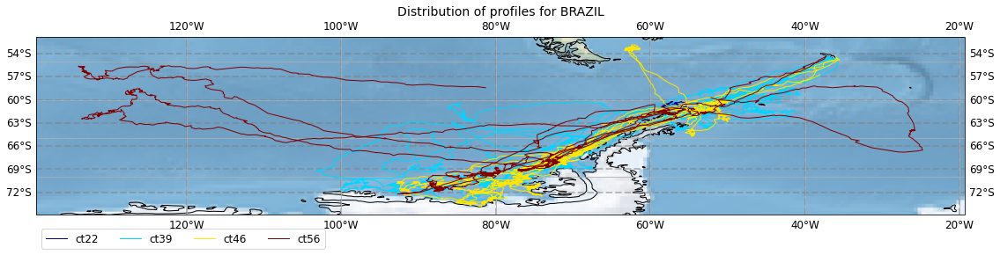

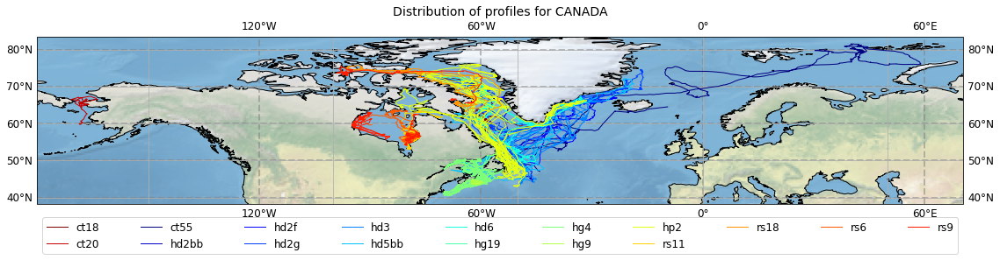

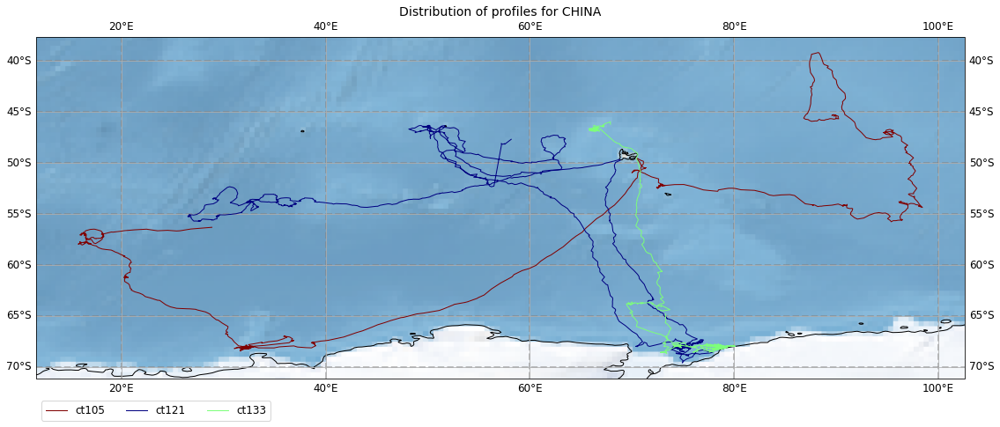

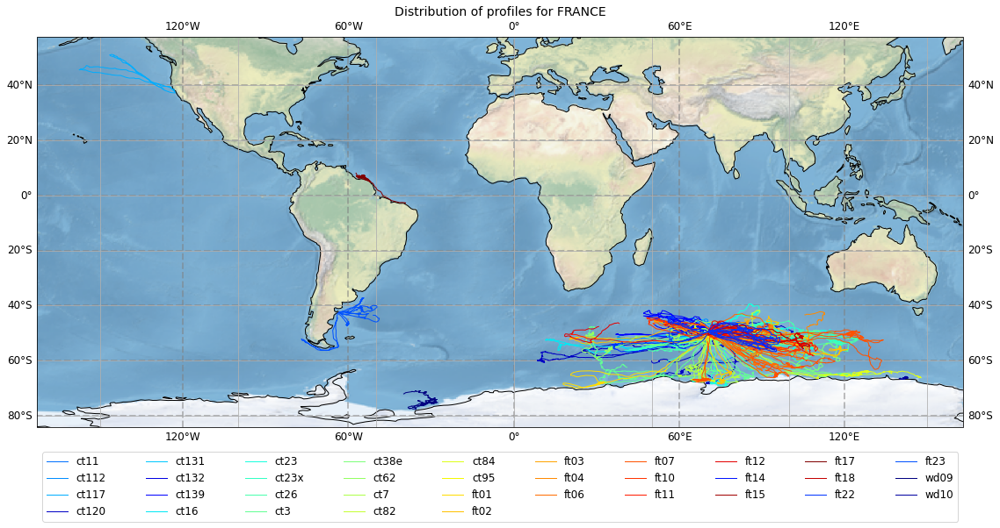

...

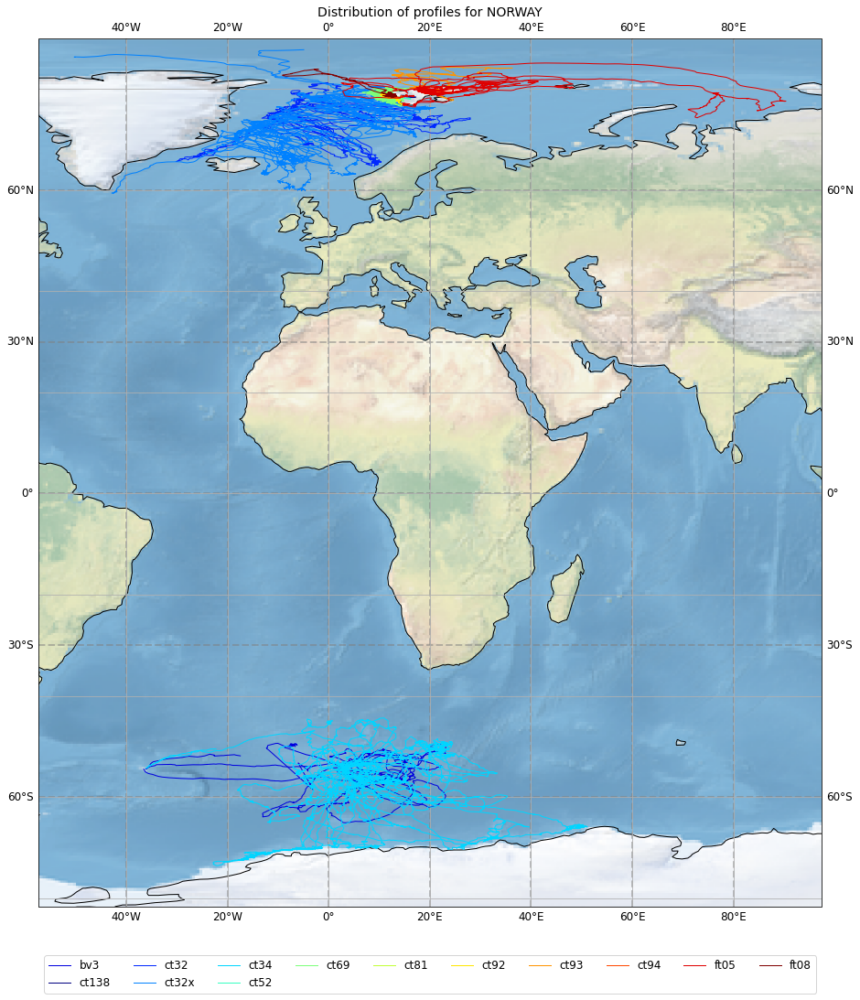

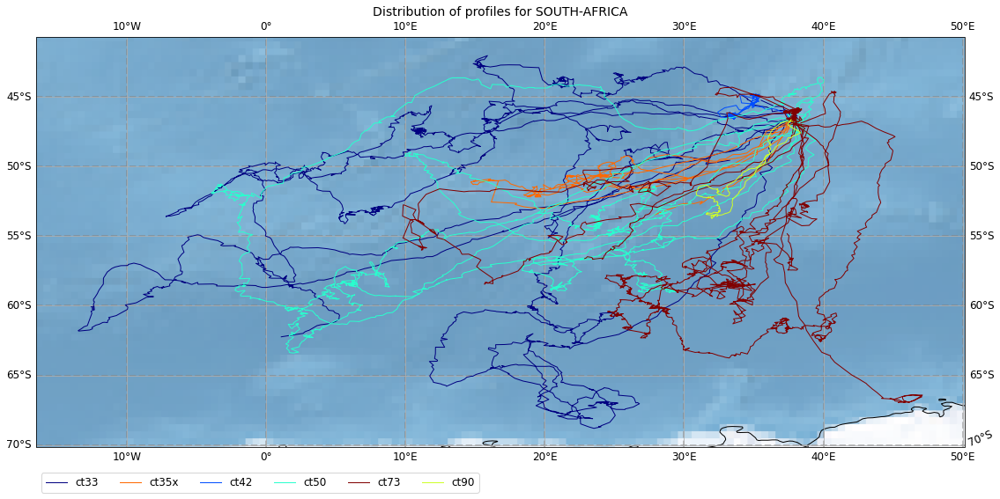

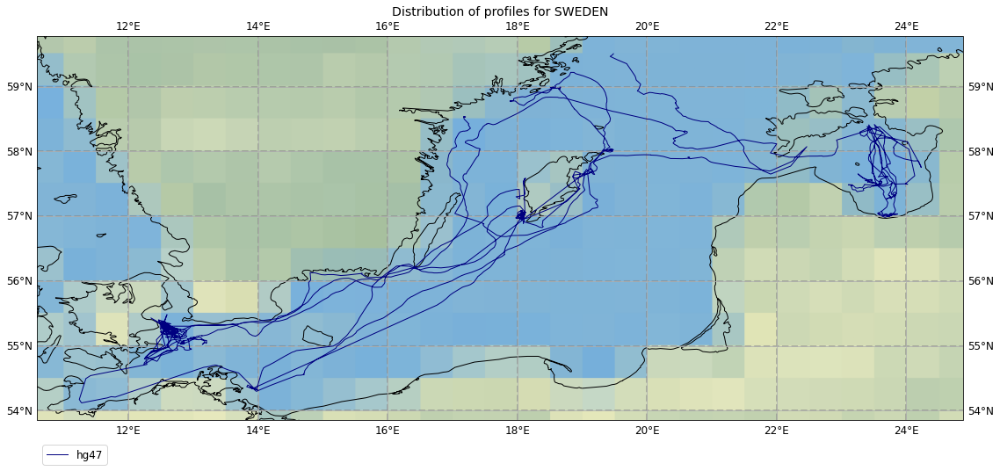

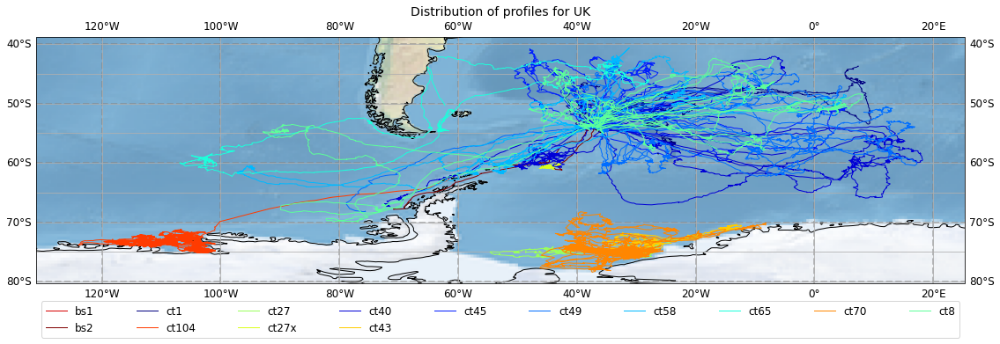

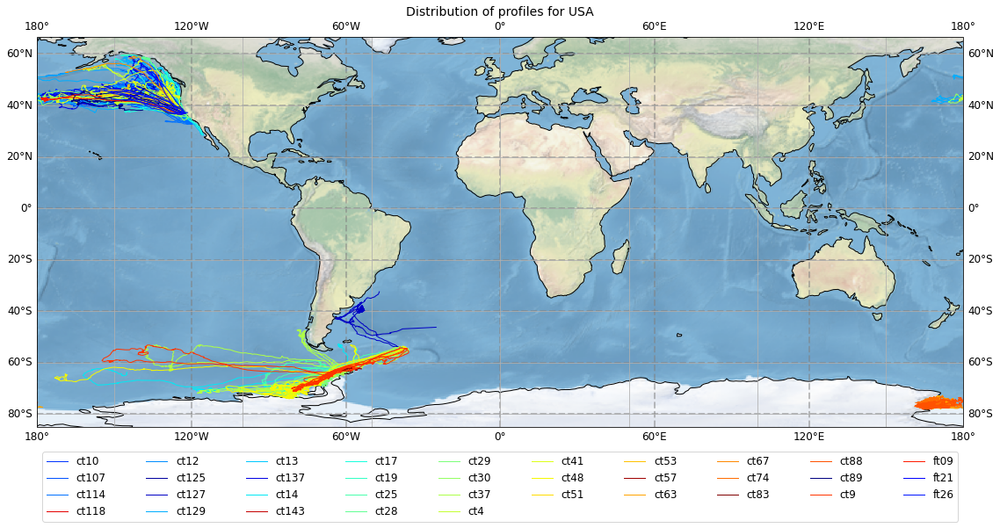

In [12]:
df_country = ldeployments[['DEPLOYMENT_CODE','COUNTRY']]
lprofiles_countries = lprofiles.merge(df_country,on='DEPLOYMENT_CODE')
for country in lprofiles_countries.COUNTRY.unique():
    lprofiles_country = lprofiles_countries[lprofiles_countries.COUNTRY==country]
    meop_plot_data.plot_map_deployments(lprofiles_country,
                              groupby='DEPLOYMENT_CODE',
                              title=f'Distribution of profiles for {country}',
                              legend=True,
                              legend_horiz=True,
                              namefig=f'National_distribution_{country}.png',
                              folder=meop_filenames.processdir,
                             )

(<Figure size 1080x1080 with 1 Axes>,
 <cartopy.mpl.geoaxes.GeoAxesSubplot at 0x7f05608798d0>)

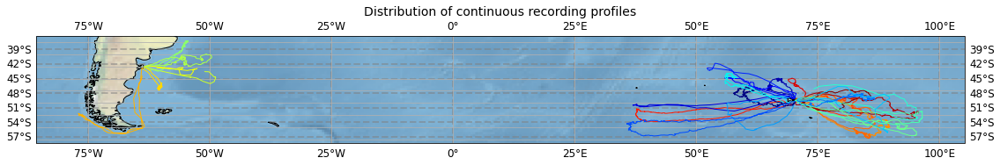

In [6]:
if 'continuous' not in lprofiles:
    lprofiles = lprofiles.merge(ltags.set_index('SMRU_PLATFORM_CODE').continuous,on='SMRU_PLATFORM_CODE')
lprofiles_continuous = lprofiles.loc[lprofiles.continuous==1,:]

meop_plot_data.plot_map_deployments(lprofiles_continuous,
                          groupby='SMRU_PLATFORM_CODE',
                          title=f'Distribution of continuous recording profiles',
                          legend=False,
                          namefig='Global_distribution_SMS.png',
                          folder=meop_filenames.processdir,
                         )

/media/disk2/roquet/MEOP_process/python/meop_plot_data.py:257: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


(<Figure size 720x720 with 1 Axes>,
 <cartopy.mpl.geoaxes.GeoAxesSubplot at 0x7f0560561750>)

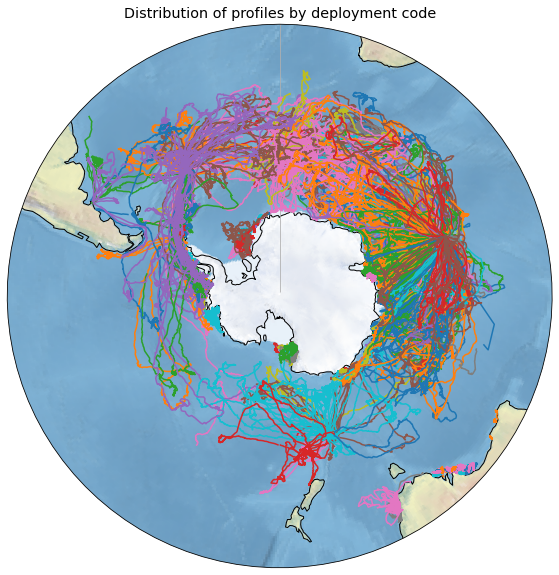

In [7]:
meop_plot_data.plot_map_stereo_south(lprofiles,
                          groupby='DEPLOYMENT_CODE',
                          title=f'Distribution of profiles by deployment code',
                          legend=False,
                          namefig=meop_filenames.processdir / 'Global_distribution_CTD_Southern_Ocean',
                         )

(<Figure size 1080x1080 with 1 Axes>,
 <cartopy.mpl.geoaxes.GeoAxesSubplot at 0x7f056247ed50>)

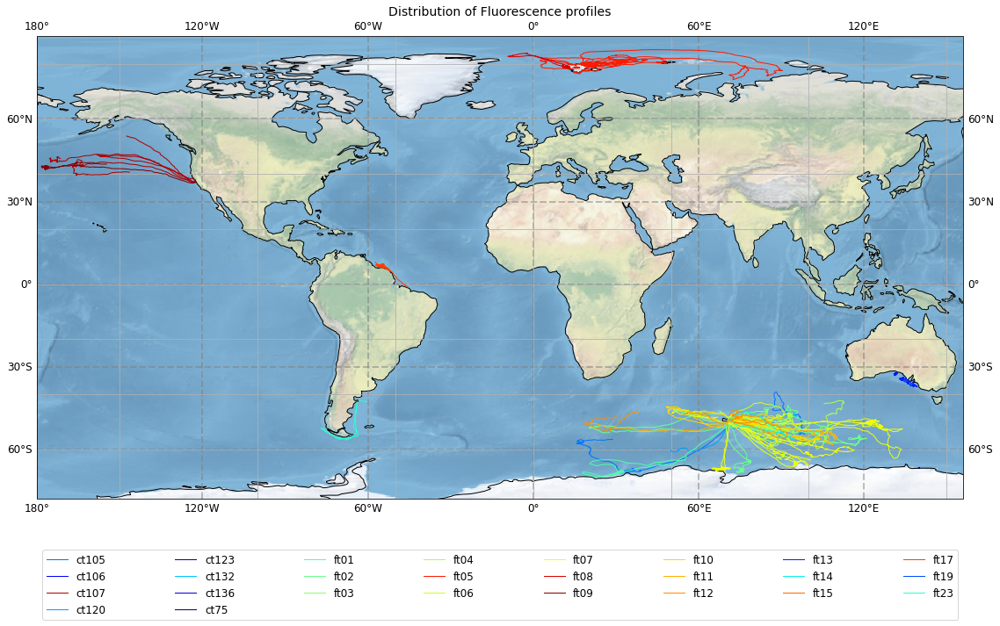

In [8]:
meop_plot_data.plot_map_deployments(lprofiles[lprofiles.N_CHLA>0],
                                    groupby='DEPLOYMENT_CODE',
                                    title='Distribution of Fluorescence profiles',
                                    legend_horiz=True,
                                    namefig=meop_filenames.processdir / 'global_map_chla_profiles.png'
                                   )